In [1]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Mon Jun 13 11:39:46 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   45C    P8    12W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import tensorflow as tf
import os
import random
import numpy as np

from tqdm import tqdm

import cv2

from skimage.io import imread, imshow
from skimage.filters import threshold_otsu
from skimage.transform import resize
import matplotlib.pyplot as plt

from google.colab.patches import cv2_imshow

In [22]:
pathImg = "/content/drive/MyDrive/VeriSetlerim/kitaplar/rgb/"
pathMask = "/content/drive/MyDrive/VeriSetlerim/kitaplar/mask/"

dataList = os.listdir(pathImg) # Resim isimleri ile maske isimleri aynı, onun için tek bir dataList'te tutuldu
dataList.sort()

dataImgs = np.zeros((90, 256, 256, 3), dtype=np.uint8)
dataMasks = np.zeros((90, 256, 256, 1), dtype=np.bool_)

indis = 0
for data in tqdm(dataList):
  dataImg = cv2.imread(pathImg + data)
  
  dataMask = cv2.imread(pathMask + data, 0)
  dataMask = np.where(dataMask>220,255,0)
  dataMask = np.expand_dims(dataMask, axis=-1)

  dataImgs[indis] = resize(dataImg, (256, 256), mode='constant', preserve_range=True)
  dataMasks[indis] = resize(dataMask, (256, 256), mode='constant', preserve_range=True)

  indis += 1

100%|██████████| 90/90 [00:04<00:00, 21.09it/s]


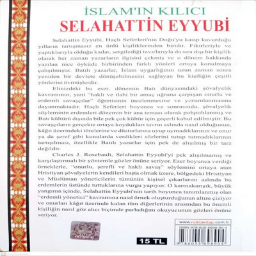

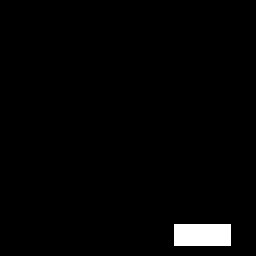

In [23]:
x = 32
cv2_imshow(dataImgs[x])
cv2_imshow(np.where(dataMasks[x]==True, 255, 0))

In [27]:
# Modeli oluşturalım
inputs = tf.keras.layers.Input((256, 256, 3))
s = tf.keras.layers.Lambda(lambda x: x/ 255)(inputs)

# Contraction Path (Daralma / Büzülme Yolu)
c1 = tf.keras.layers.Conv2D(64, (3,3), activation='relu', kernel_initializer="he_normal", padding="same")(s)
c1 = tf.keras.layers.Dropout(0.1)(c1)
c1 = tf.keras.layers.Conv2D(64, (3,3), activation='relu', kernel_initializer="he_normal", padding="same")(c1)
p1 = tf.keras.layers.MaxPooling2D((2,2))(c1)

c2 = tf.keras.layers.Conv2D(128, (3,3), activation='relu', kernel_initializer="he_normal", padding="same")(p1)
c2 = tf.keras.layers.Dropout(0.1)(c2)
c2 = tf.keras.layers.Conv2D(128, (3,3), activation='relu', kernel_initializer="he_normal", padding="same")(c2)
p2 = tf.keras.layers.MaxPooling2D((2,2))(c2)

c3 = tf.keras.layers.Conv2D(256, (3,3), activation='relu', kernel_initializer="he_normal", padding="same")(p2)
c3 = tf.keras.layers.Dropout(0.2)(c3)
c3 = tf.keras.layers.Conv2D(256, (3,3), activation='relu', kernel_initializer="he_normal", padding="same")(c3)
p3 = tf.keras.layers.MaxPooling2D((2,2))(c3)

c4 = tf.keras.layers.Conv2D(512, (3,3), activation='relu', kernel_initializer="he_normal", padding="same")(p3)
c4 = tf.keras.layers.Dropout(0.2)(c4)
c4 = tf.keras.layers.Conv2D(512, (3,3), activation='relu', kernel_initializer="he_normal", padding="same")(c4)
p4 = tf.keras.layers.MaxPooling2D(pool_size=(2,2))(c4)

c5 = tf.keras.layers.Conv2D(1024, (3,3), activation='relu', kernel_initializer="he_normal", padding="same")(p4)
c5 = tf.keras.layers.Dropout(0.3)(c5)
c5 = tf.keras.layers.Conv2D(1024, (3,3), activation='relu', kernel_initializer="he_normal", padding="same")(c5)

# Expansive Path (Yayılma / Genişleme Yolu)
u6 = tf.keras.layers.Conv2DTranspose(512, (3,3), strides=(2,2), padding="same")(c5)
u6 = tf.keras.layers.concatenate([u6, c4])
c6 = tf.keras.layers.Conv2D(512, (3,3), activation='relu', kernel_initializer="he_normal", padding="same")(u6)
c6 = tf.keras.layers.Dropout(0.2)(c6)
c6 = tf.keras.layers.Conv2D(512, (3,3), activation='relu', kernel_initializer="he_normal", padding="same")(c6)

u7 = tf.keras.layers.Conv2DTranspose(256, (3,3), strides=(2,2), padding="same")(c6)
u7 = tf.keras.layers.concatenate([u7, c3])
c7 = tf.keras.layers.Conv2D(256, (3,3), activation='relu', kernel_initializer="he_normal", padding="same")(u7)
c7 = tf.keras.layers.Dropout(0.2)(c7)
c7 = tf.keras.layers.Conv2D(256, (3,3), activation='relu', kernel_initializer="he_normal", padding="same")(c7)

u8 = tf.keras.layers.Conv2DTranspose(128, (3,3), strides=(2,2), padding="same")(c7)
u8 = tf.keras.layers.concatenate([u8, c2])
c8 = tf.keras.layers.Conv2D(128, (3,3), activation='relu', kernel_initializer="he_normal", padding="same")(u8)
c8 = tf.keras.layers.Dropout(0.1)(c8)
c8 = tf.keras.layers.Conv2D(128, (3,3), activation='relu', kernel_initializer="he_normal", padding="same")(c8)

u9 = tf.keras.layers.Conv2DTranspose(64, (3,3), strides=(2,2), padding="same")(c8)
u9 = tf.keras.layers.concatenate([u9, c1], axis=3)
c9 = tf.keras.layers.Conv2D(64, (3,3), activation='relu', kernel_initializer="he_normal", padding="same")(u9)
c9 = tf.keras.layers.Dropout(0.1)(c9)
c9 = tf.keras.layers.Conv2D(64, (3,3), activation='relu', kernel_initializer="he_normal", padding="same")(c9)

outputs = tf.keras.layers.Conv2D(1, (1,1), activation='sigmoid', kernel_initializer="he_normal", padding="same")(c9)

model = tf.keras.Model(inputs = [inputs], outputs = [outputs])

In [28]:
model.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 lambda_3 (Lambda)              (None, 256, 256, 3)  0           ['input_4[0][0]']                
                                                                                                  
 conv2d_48 (Conv2D)             (None, 256, 256, 64  1792        ['lambda_3[0][0]']               
                                )                                                                 
                                                                                            

In [29]:
checkpointer = tf.keras.callbacks.ModelCheckpoint('u-net_deneme.h5', verbose=1, save_best_only=True)

# Epoch'un gereksiz devam etmemesi için erken durdurma mekanizması (callbacks)
callbacks = [tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
            tf.keras.callbacks.TensorBoard(log_dir='logs')]


results = model.fit(dataImgs, dataMasks, validation_split=0.1, batch_size=16, epochs=25, callbacks = callbacks)

Epoch 1/25
6/6 [==============================] - 34s 2s/step - loss: 0.4022 - accuracy: 0.8070 - val_loss: 0.1171 - val_accuracy: 0.9813
Epoch 2/25
6/6 [==============================] - 5s 786ms/step - loss: 0.1584 - accuracy: 0.9750 - val_loss: 0.1132 - val_accuracy: 0.9818
Epoch 3/25
6/6 [==============================] - 5s 788ms/step - loss: 0.1465 - accuracy: 0.9762 - val_loss: 0.1151 - val_accuracy: 0.9806
Epoch 4/25
6/6 [==============================] - 5s 792ms/step - loss: 0.1433 - accuracy: 0.9756 - val_loss: 0.1066 - val_accuracy: 0.9823
Epoch 5/25
6/6 [==============================] - 5s 777ms/step - loss: 0.1416 - accuracy: 0.9765 - val_loss: 0.1068 - val_accuracy: 0.9823
Epoch 6/25
6/6 [==============================] - 5s 779ms/step - loss: 0.1342 - accuracy: 0.9765 - val_loss: 0.1013 - val_accuracy: 0.9823
Epoch 7/25
6/6 [==============================] - 5s 806ms/step - loss: 0.1297 - accuracy: 0.9765 - val_loss: 0.0932 - val_accuracy: 0.9823
Epoch 8/25
6/6 [======

In [30]:
preds_test = model.predict(dataImgs, verbose=1)

3/3 [==============================] - 20s 4s/step


In [31]:
preds_test_t = np.where(preds_test > 0.5, 255, 0) # 0-1 -> 0-255'e dönüştürüşüyor

1. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


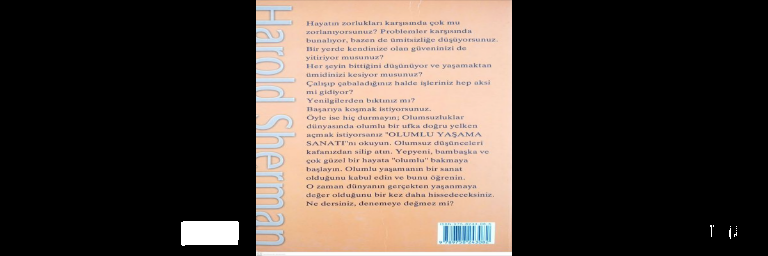




2. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


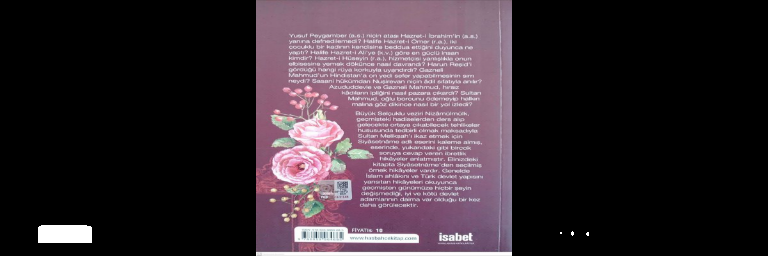




3. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


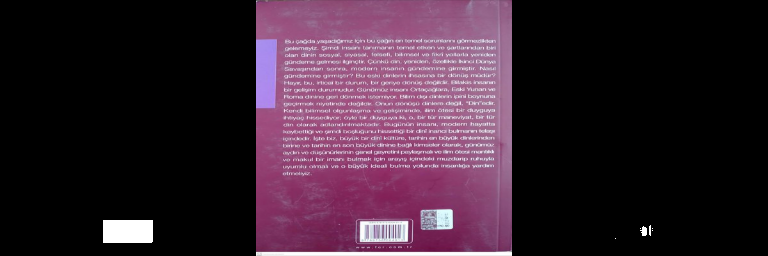




4. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


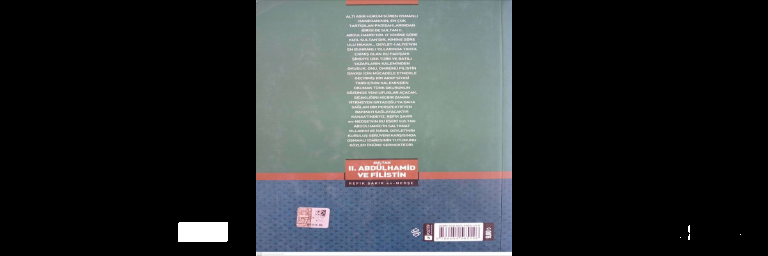




5. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


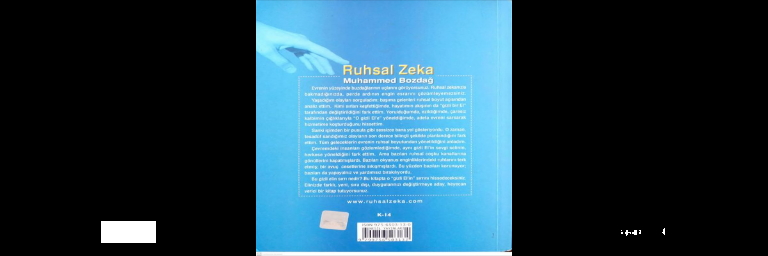




6. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


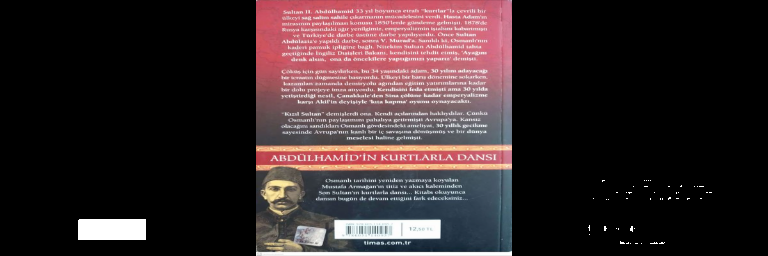




7. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


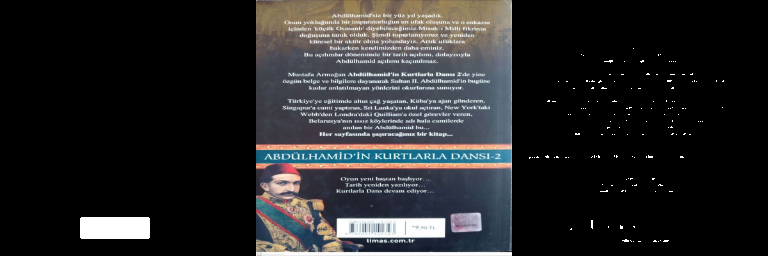




8. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


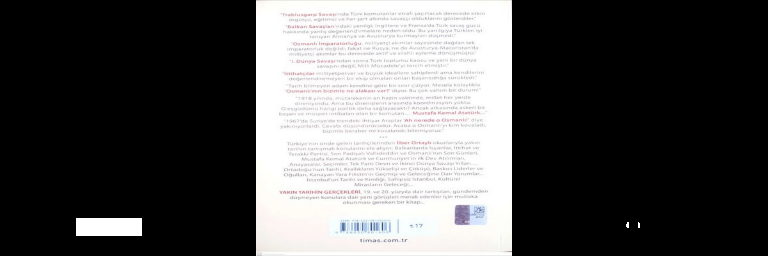




9. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


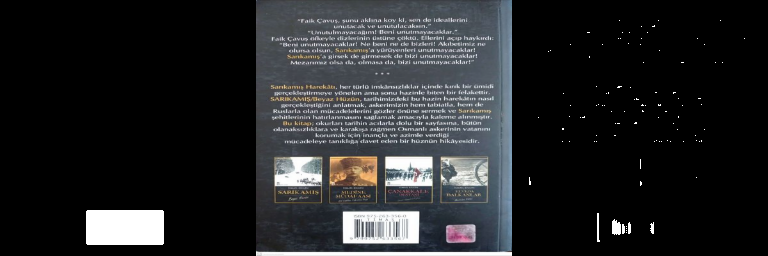




10. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


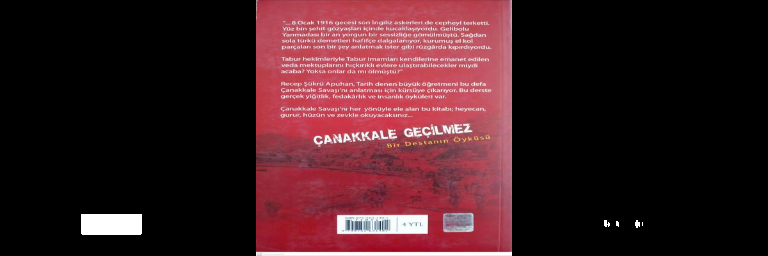




11. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


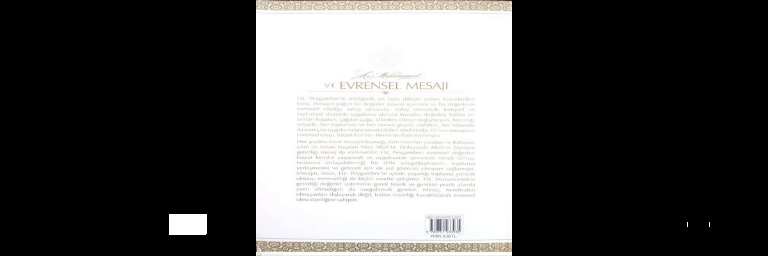




12. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


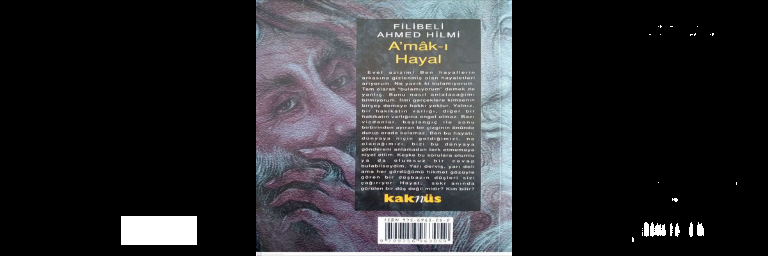




13. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


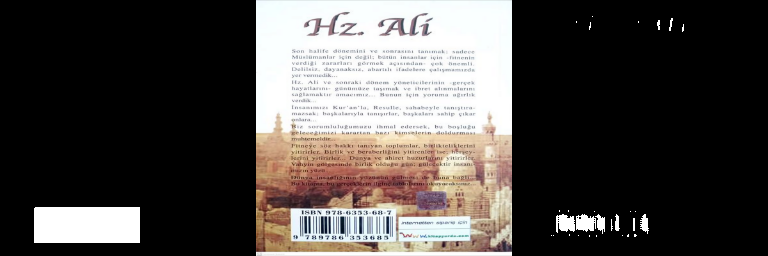




14. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


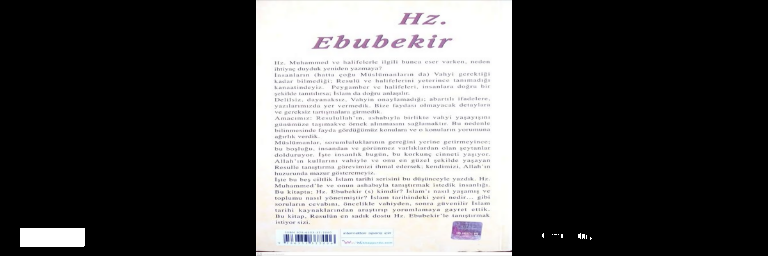




15. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


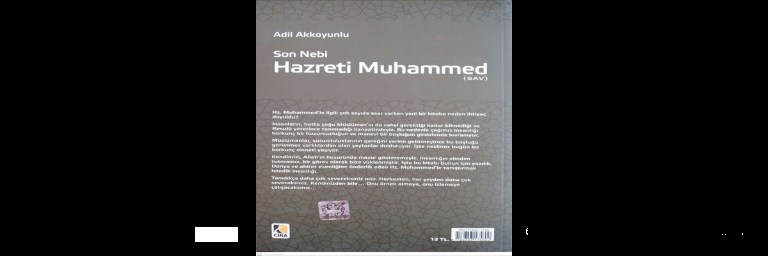




16. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


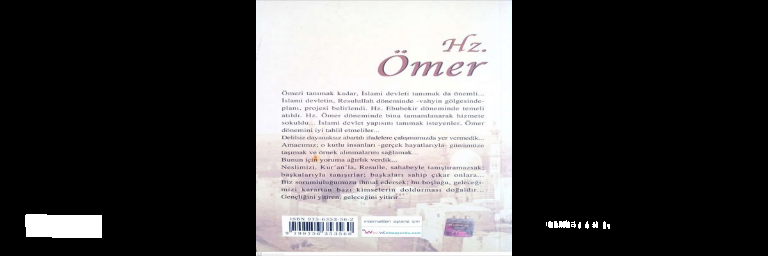




17. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


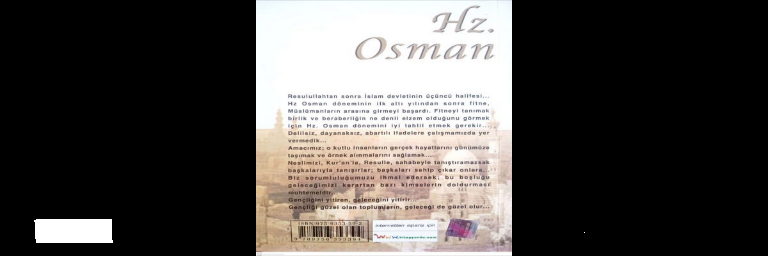




18. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


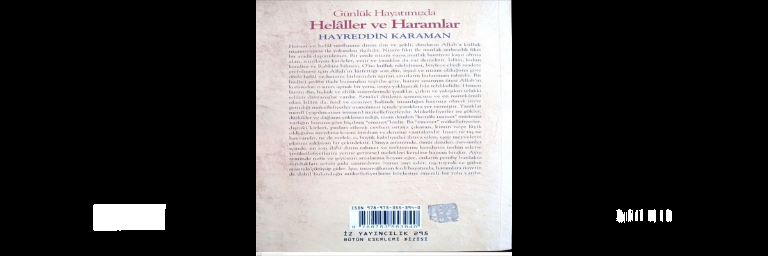




19. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


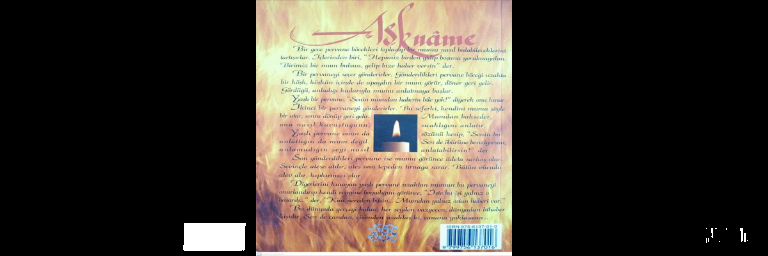




20. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


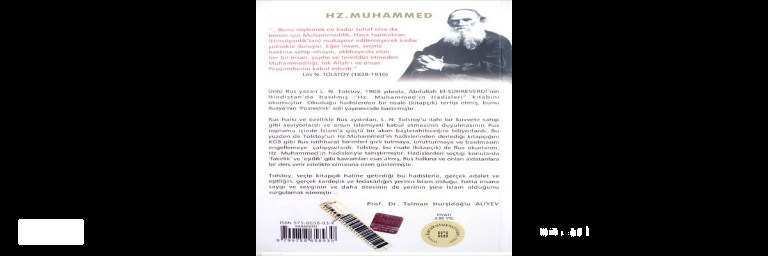




21. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


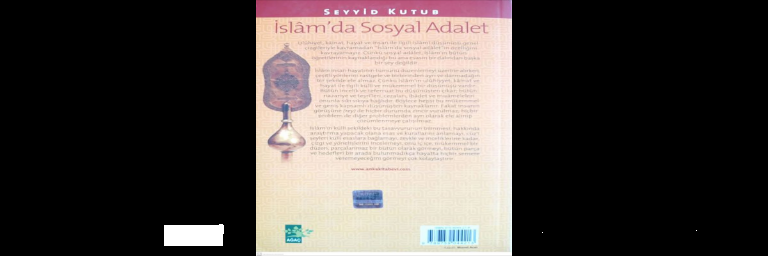




22. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


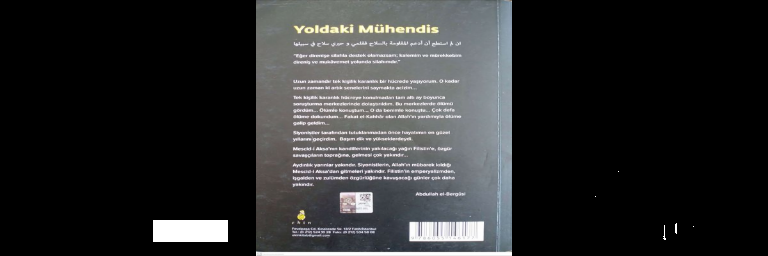




23. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


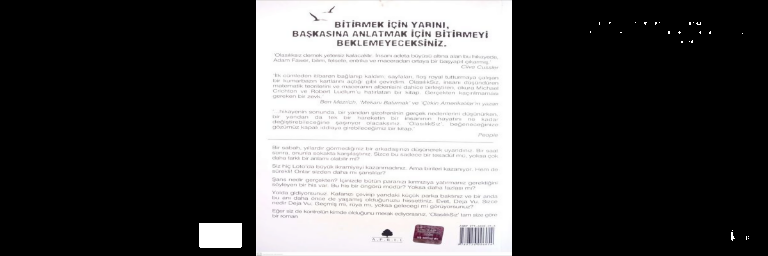




24. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


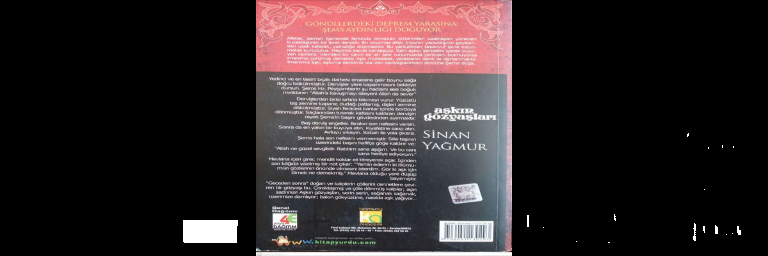




25. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


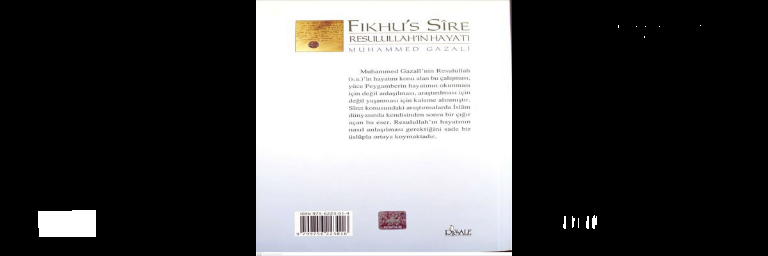




26. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


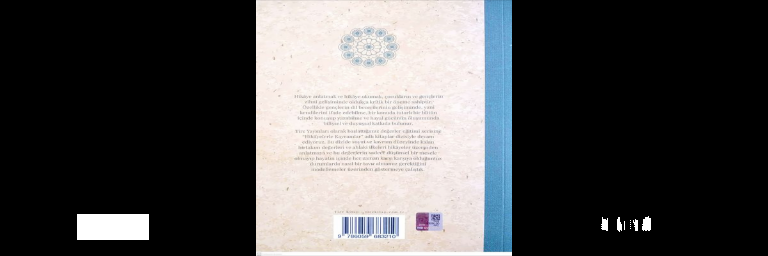




27. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


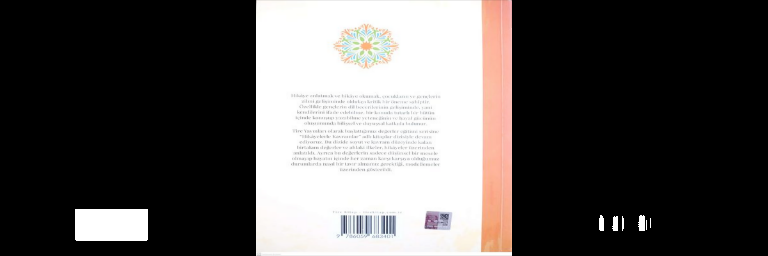




28. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


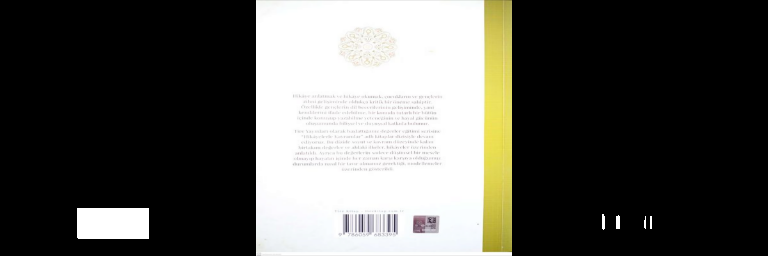




29. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


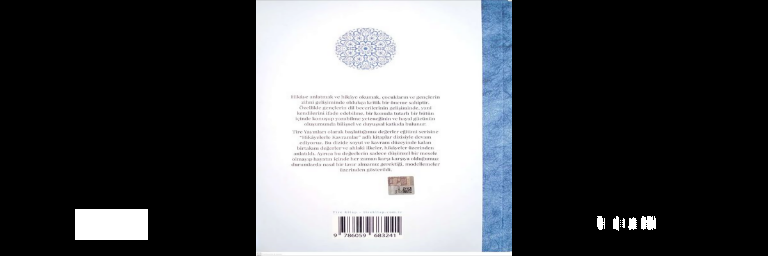




30. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


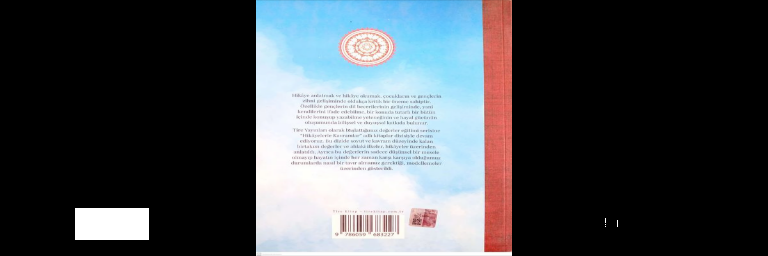




31. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


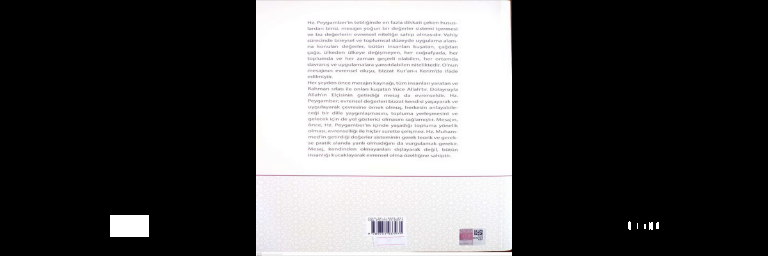




32. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


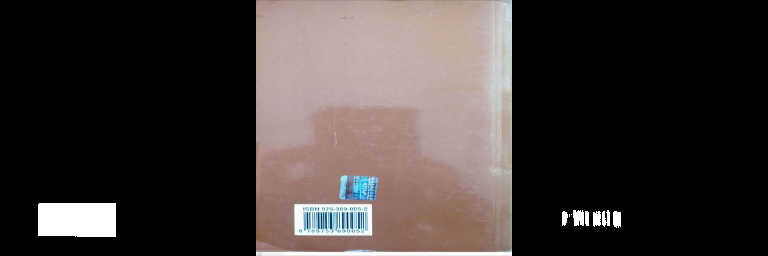




33. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


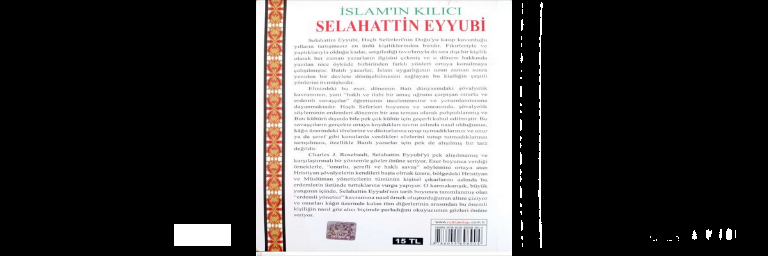




34. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


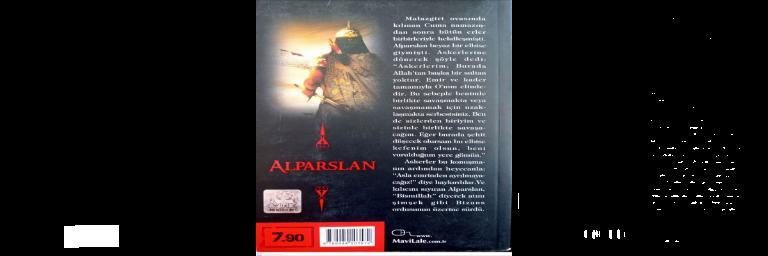




35. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


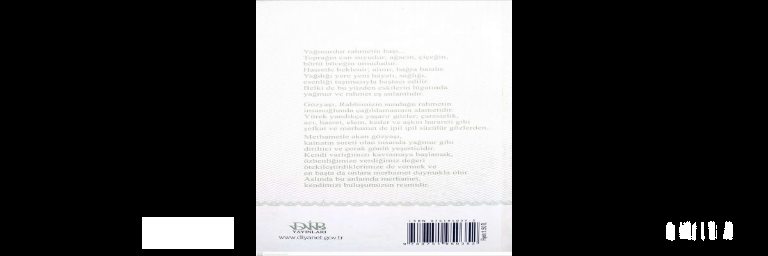




36. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


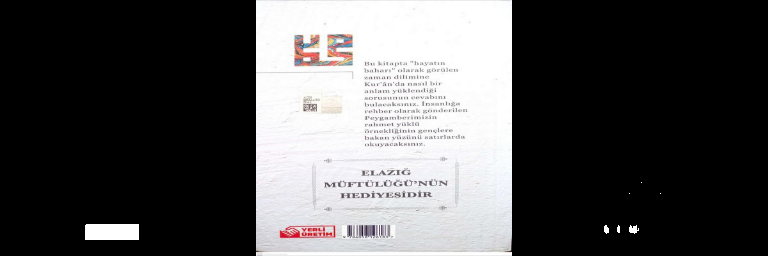




37. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


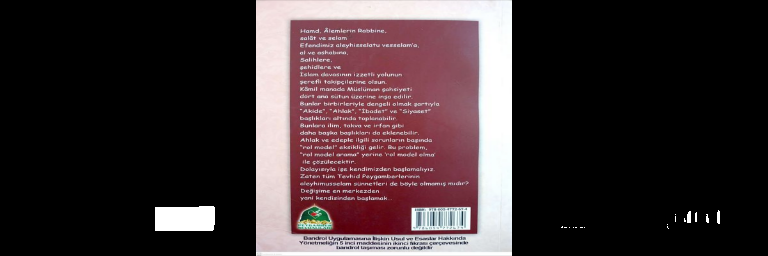




38. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


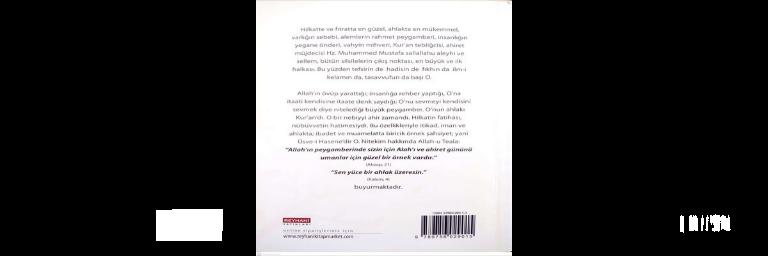




39. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


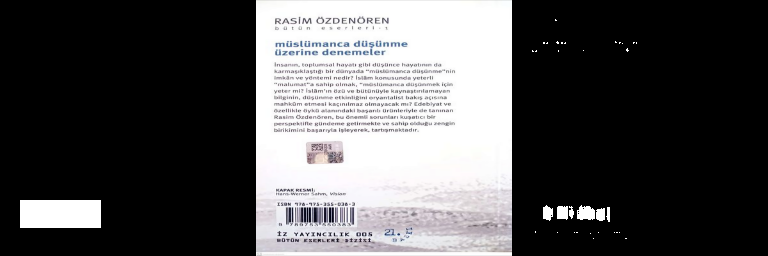




40. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


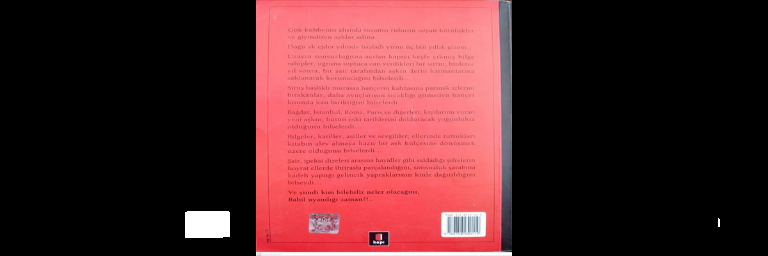




41. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


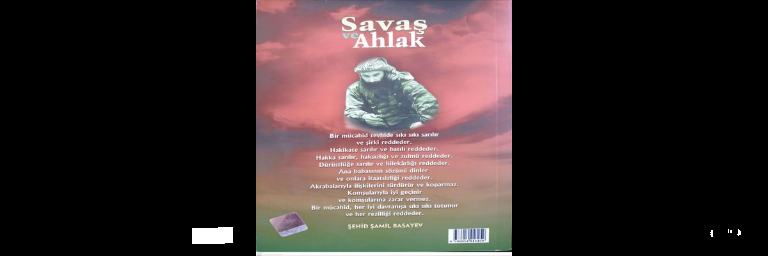




42. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


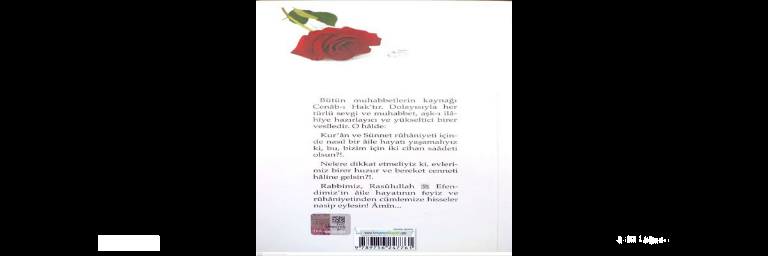




43. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


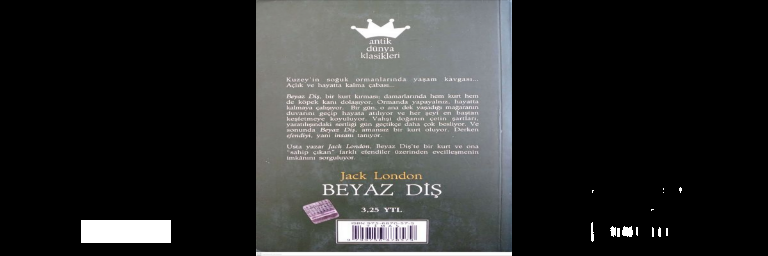




44. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


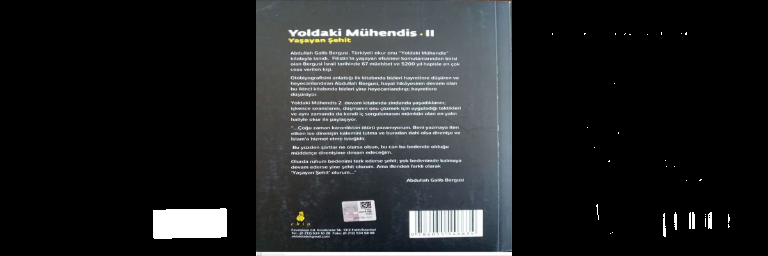




45. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


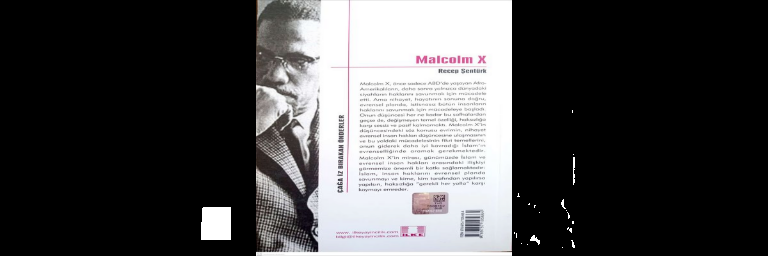




46. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


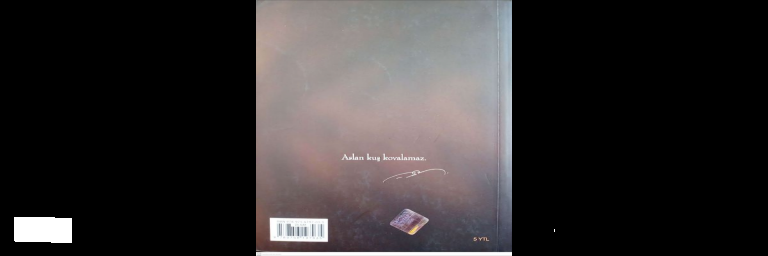




47. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


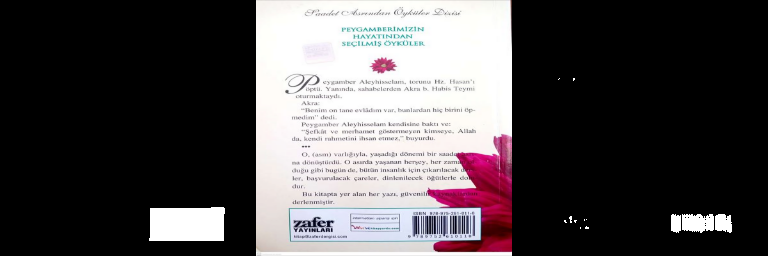




48. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


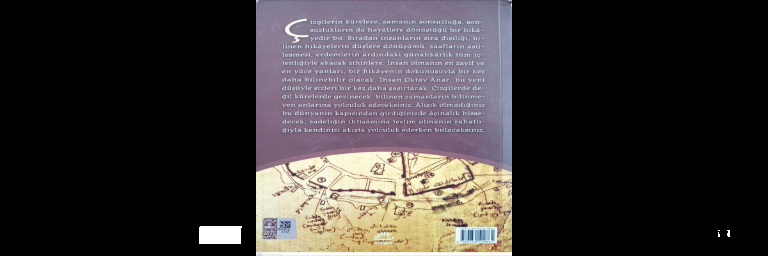




49. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


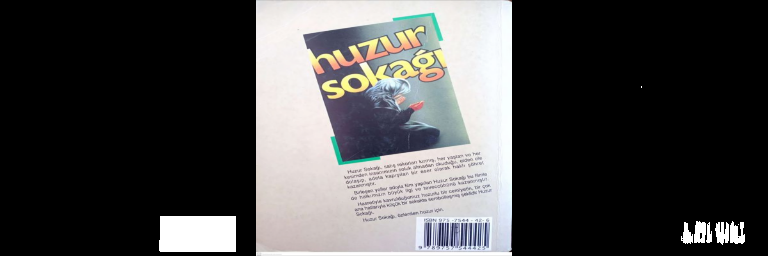




50. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


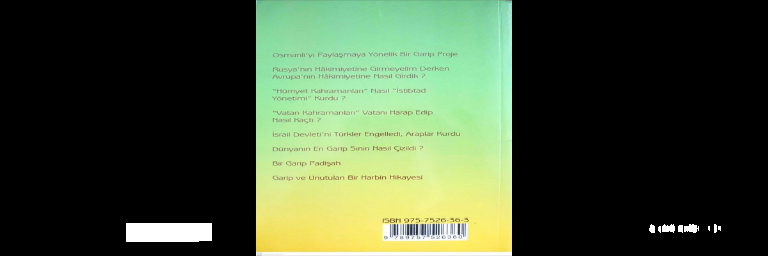




51. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


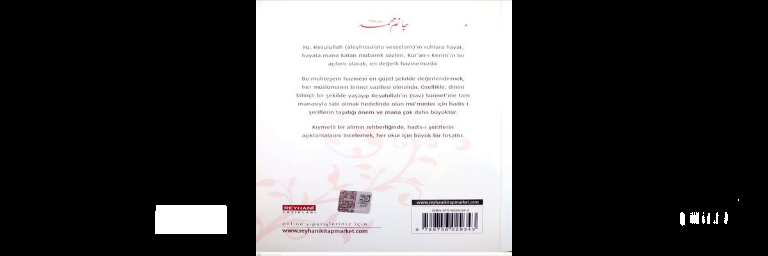




52. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


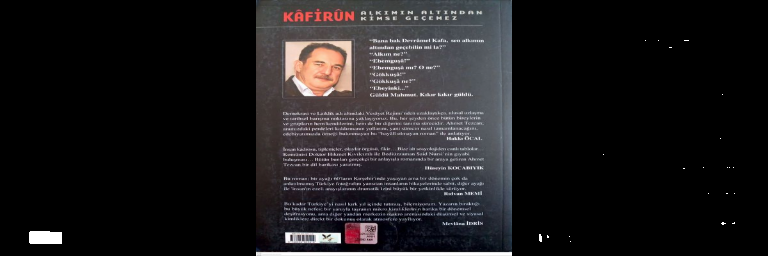




53. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


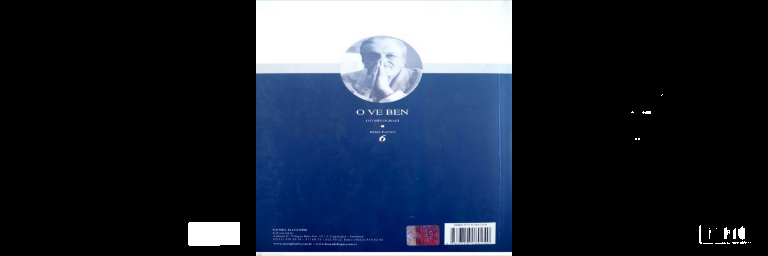




54. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


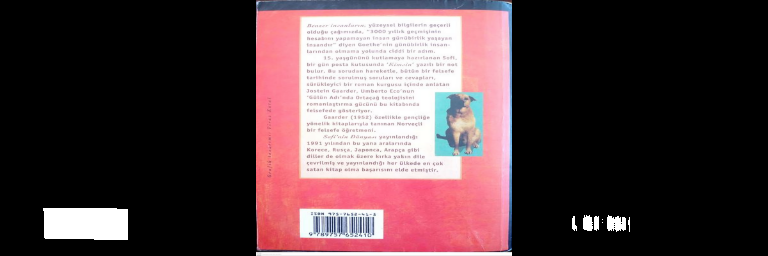




55. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


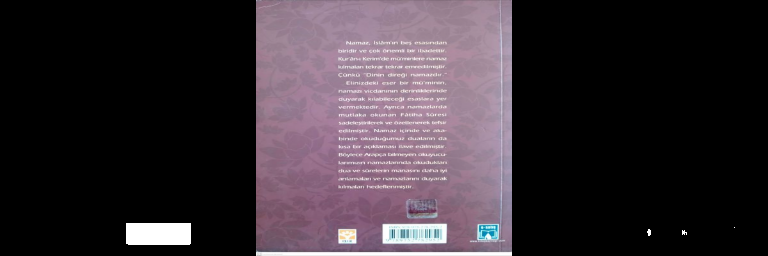




56. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


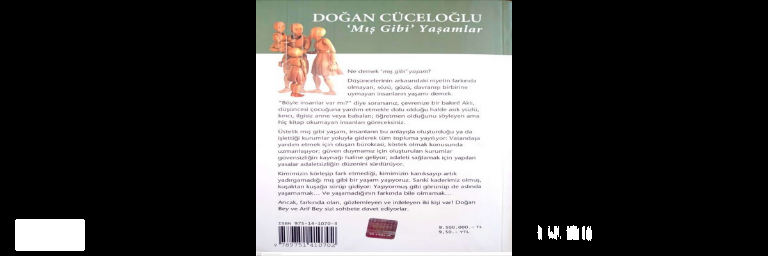




57. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


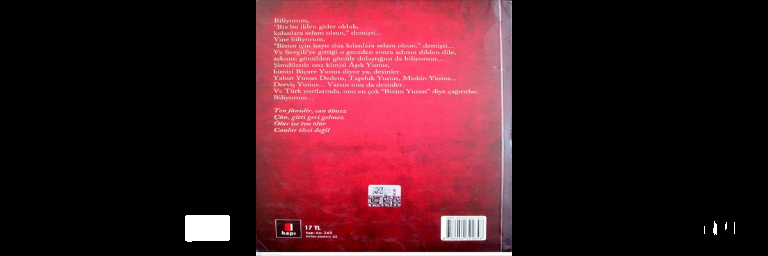




58. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


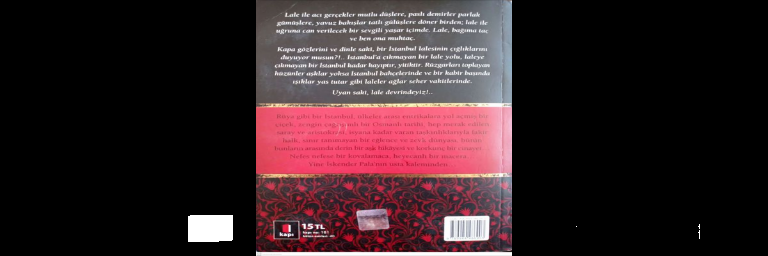




59. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


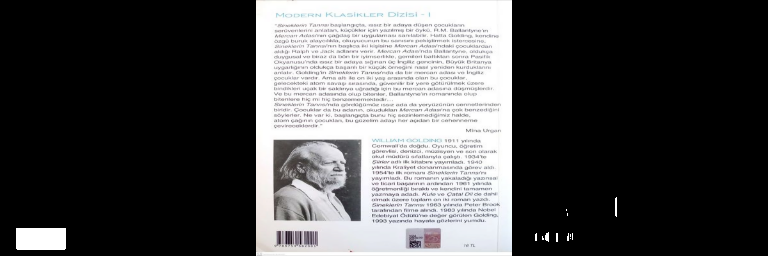




60. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


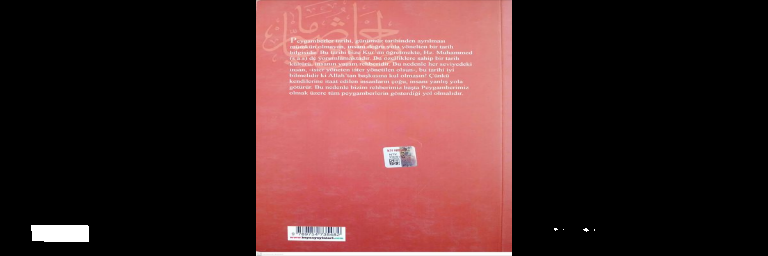




61. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


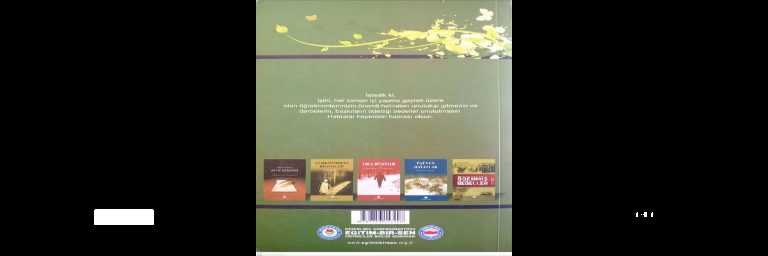




62. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


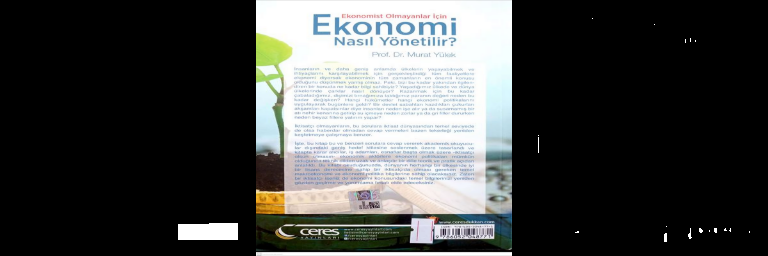




63. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


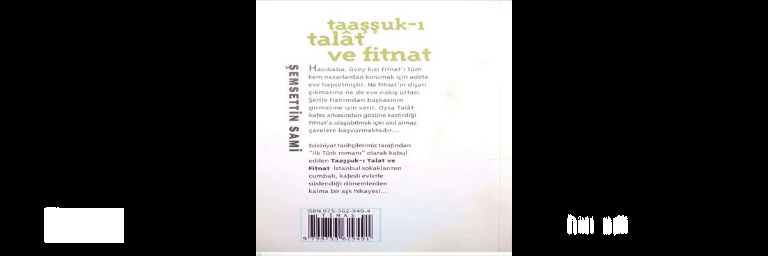




64. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


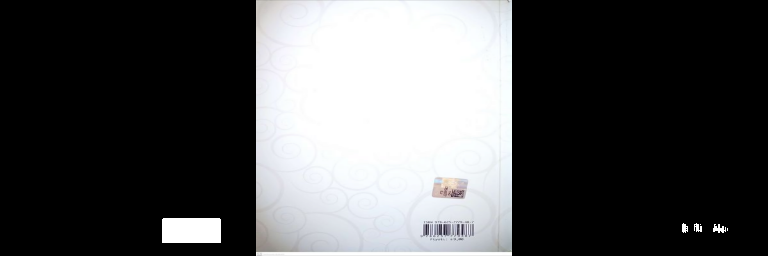




65. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


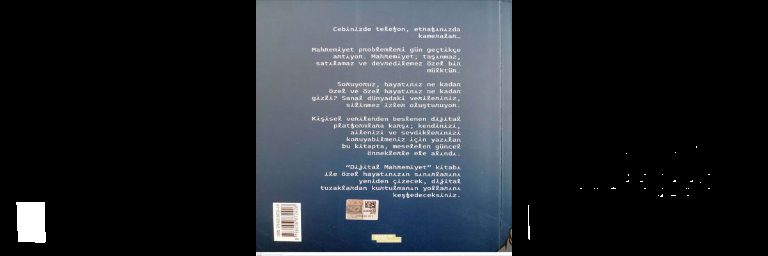




66. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


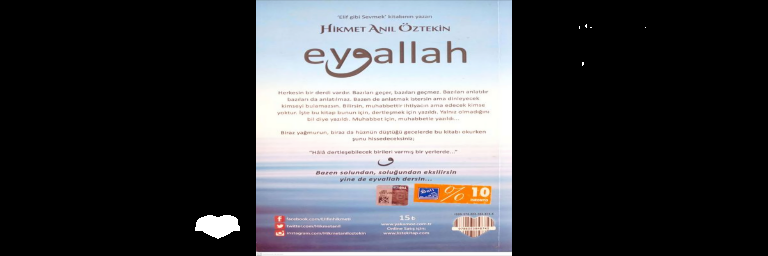




67. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


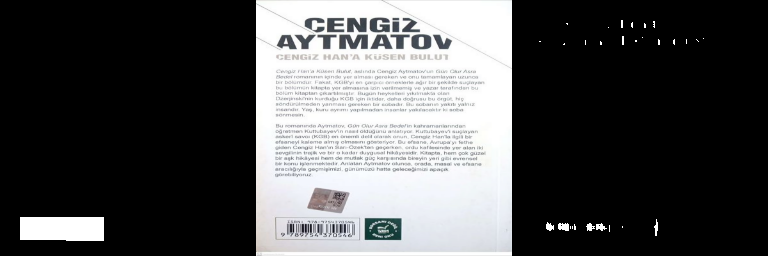




68. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


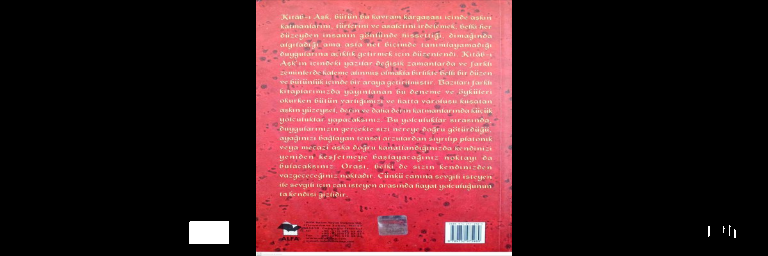




69. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


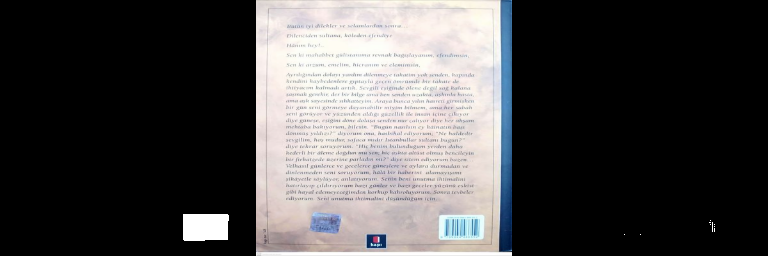




70. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


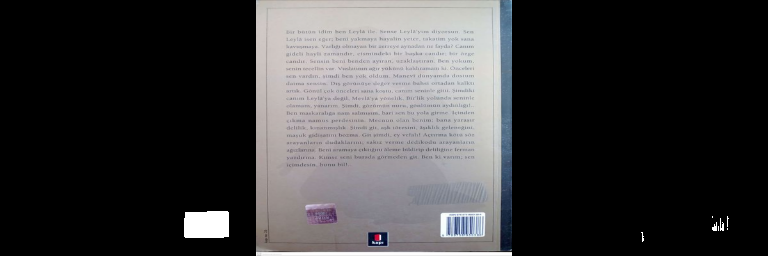




71. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


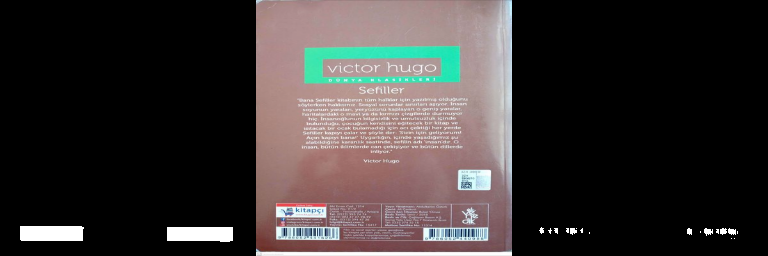




72. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


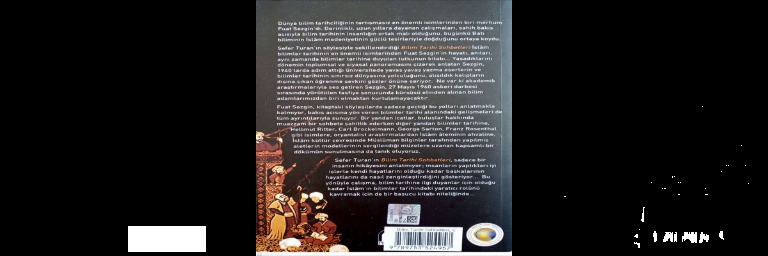




73. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


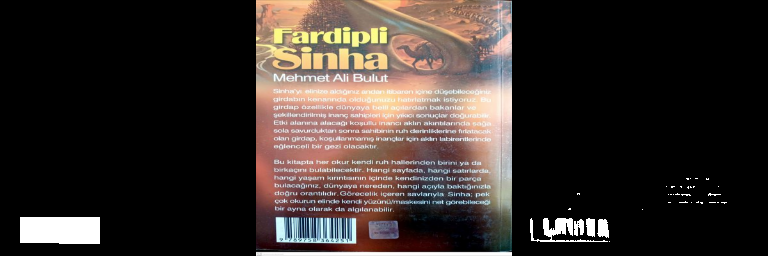




74. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


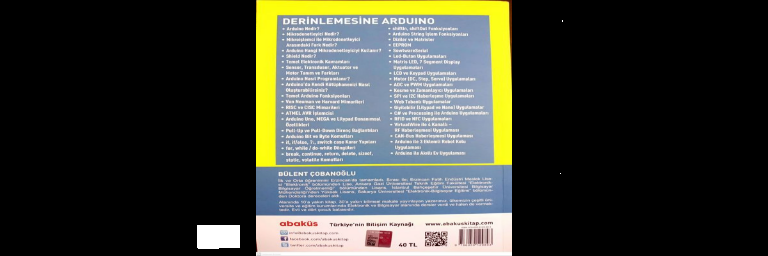




75. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


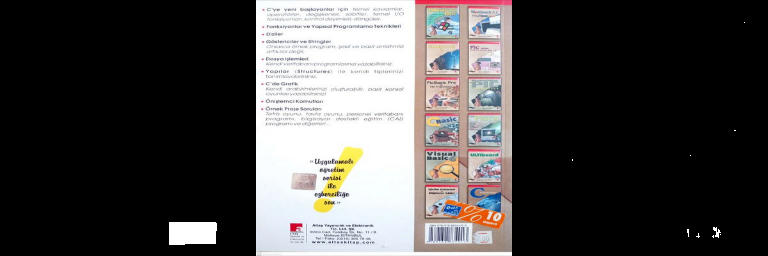




76. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


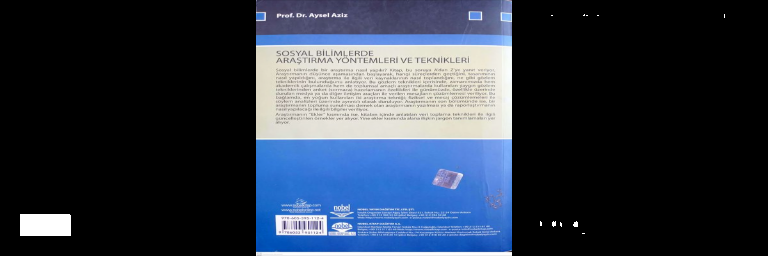




77. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


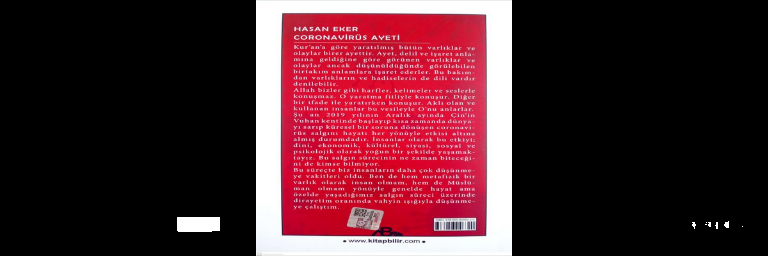




78. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


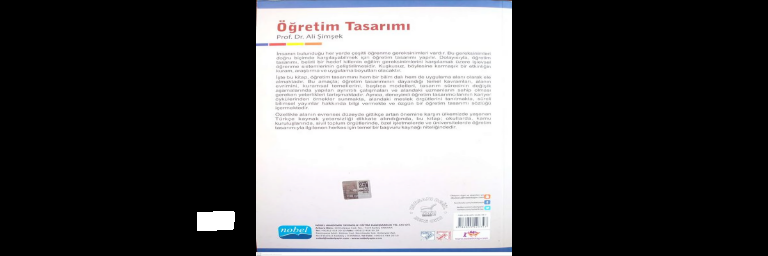




79. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


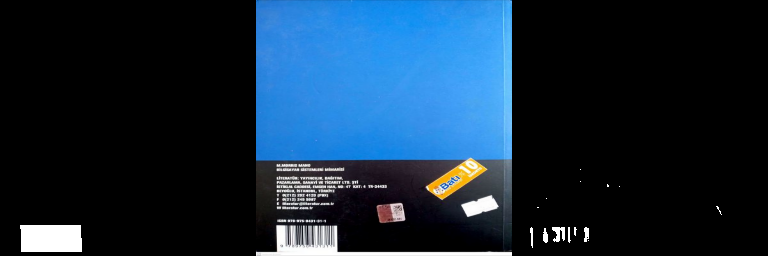




80. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


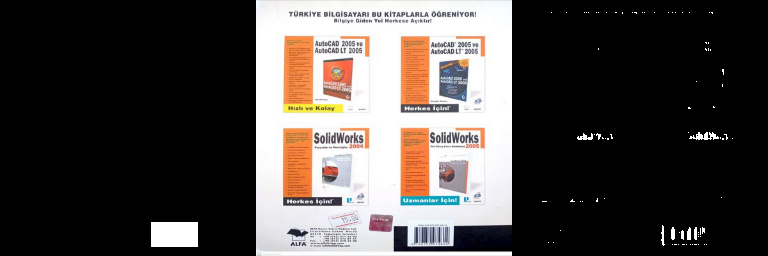




81. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


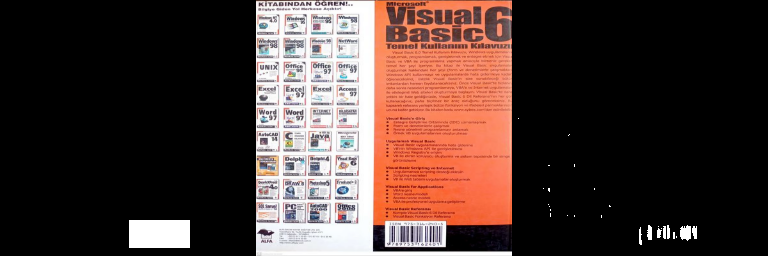




82. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


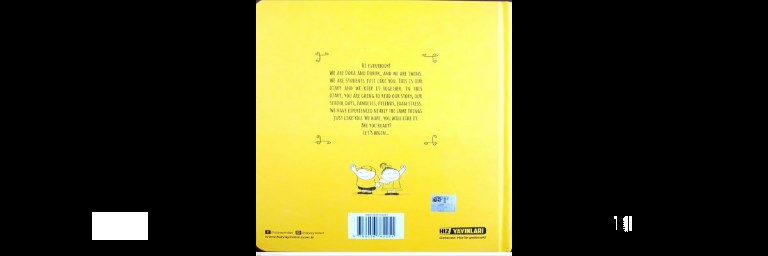




83. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


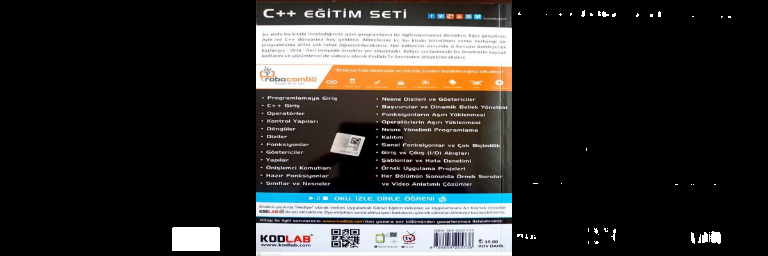




84. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


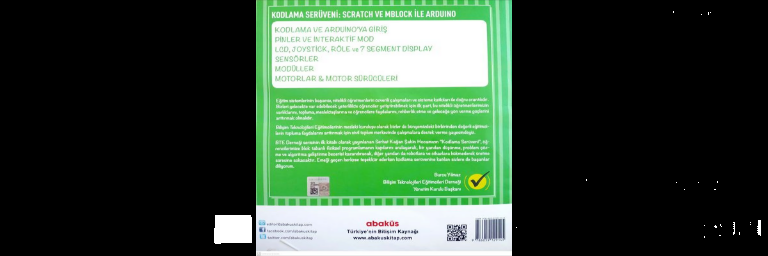




85. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


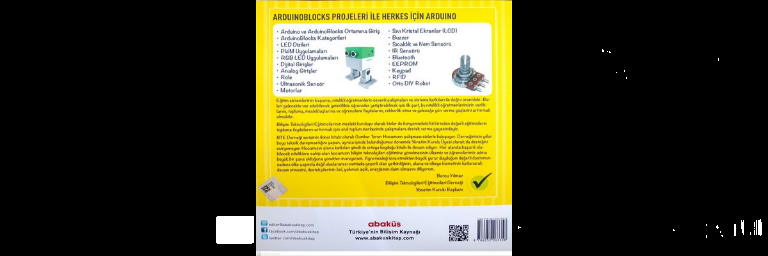




86. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


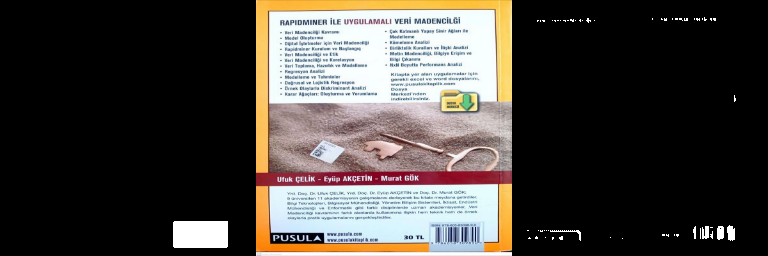




87. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


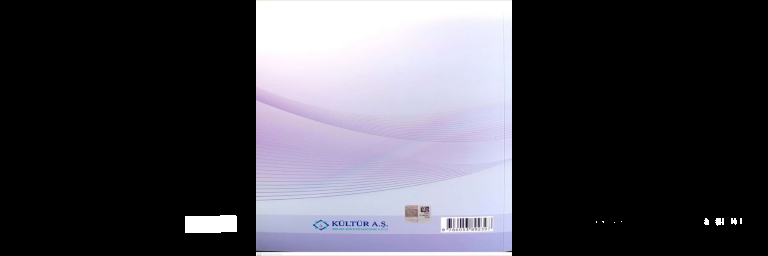




88. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


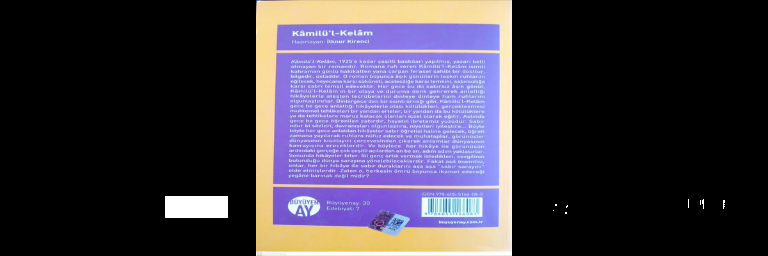




89. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


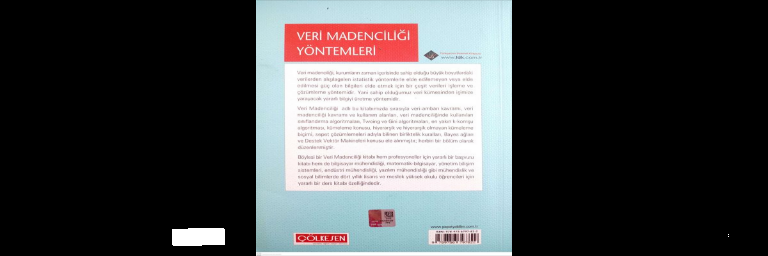




90. GÖRÜNTÜ
	 Maske 			 Orjinal Görüntü 			 Tahmin


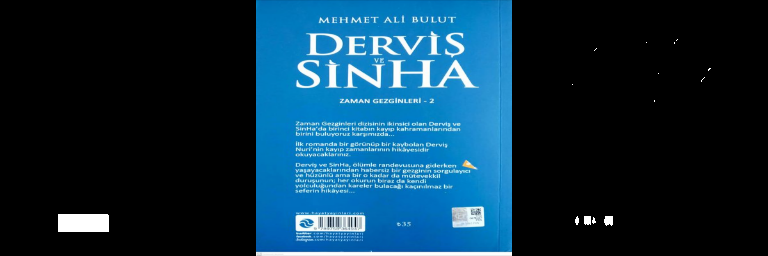

In [83]:
for x in range(90):
  gercek = dataImgs[x]

  tahmin = preds_test_t[x]
  tahmin = tahmin.astype(np.uint8)
  tahmin = cv2.cvtColor(tahmin, cv2.COLOR_GRAY2BGR)

  msk = np.where(dataMasks[x]==True, 255, 0)
  msk = msk.astype(np.uint8)
  msk = cv2.cvtColor(msk, cv2.COLOR_GRAY2BGR)

  print(x+1, ". GÖRÜNTÜ", sep="")
  print("\t Maske \t\t\t Orjinal Görüntü \t\t\t Tahmin")
  birlestir = np.hstack((msk, gercek, tahmin))

  cv2_imshow(birlestir)
  print("\n\n")